In [2]:
import scvelo as scvelo
import scanpy as sc
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization

In [32]:
adata = scv.read('/media/chang/HDD-2/chang/ctrl_velo.h5ad')

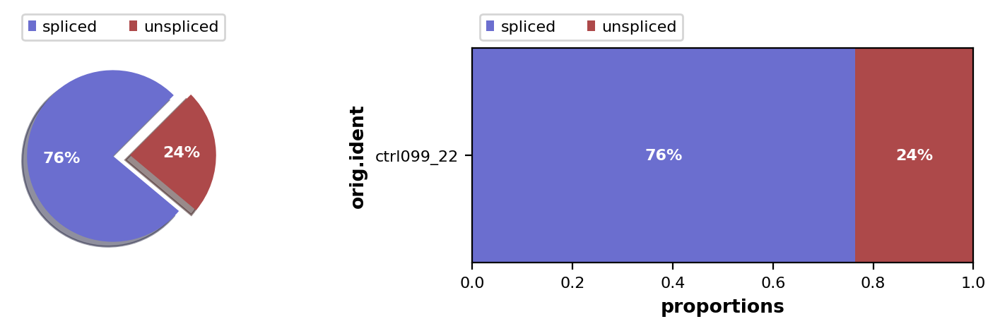

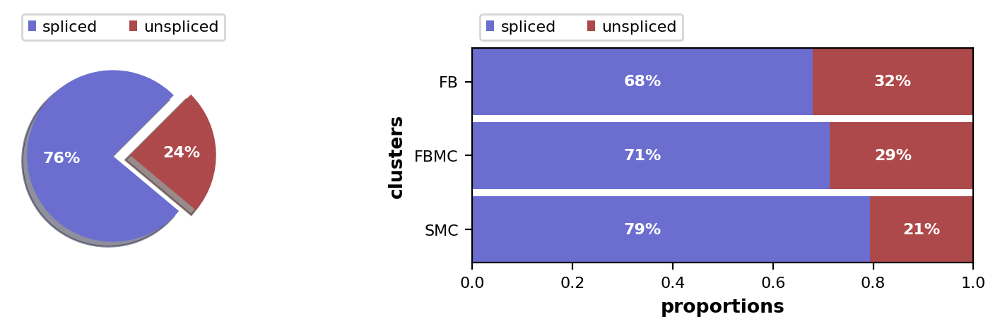

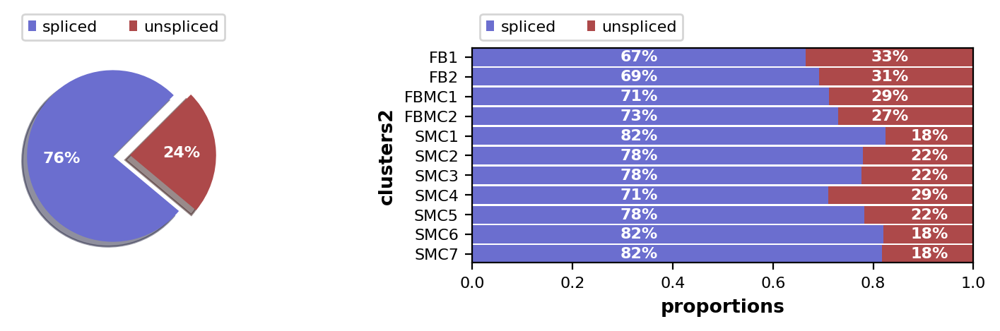

In [33]:
scv.pl.proportions(adata, groupby='orig.ident')
adata.obs['clusters'] = adata.obs['clusters'].astype('category')
scv.pl.proportions(adata, groupby='clusters')
scv.pl.proportions(adata, groupby='clusters2')

In [34]:
#adata = adata[adata.obs['clusters'].isin(["SMC","FBMC"]),:]

In [35]:
scv.pp.filter_and_normalize(adata, min_shared_counts=10, n_top_genes=2000, enforce=True)

Filtered out 49697 genes that are detected 10 counts (shared).
Normalized count data: X, spliced, unspliced.
Extracted 2000 highly variable genes.
Logarithmized X.


computing neighbors
    finished (0:00:02) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


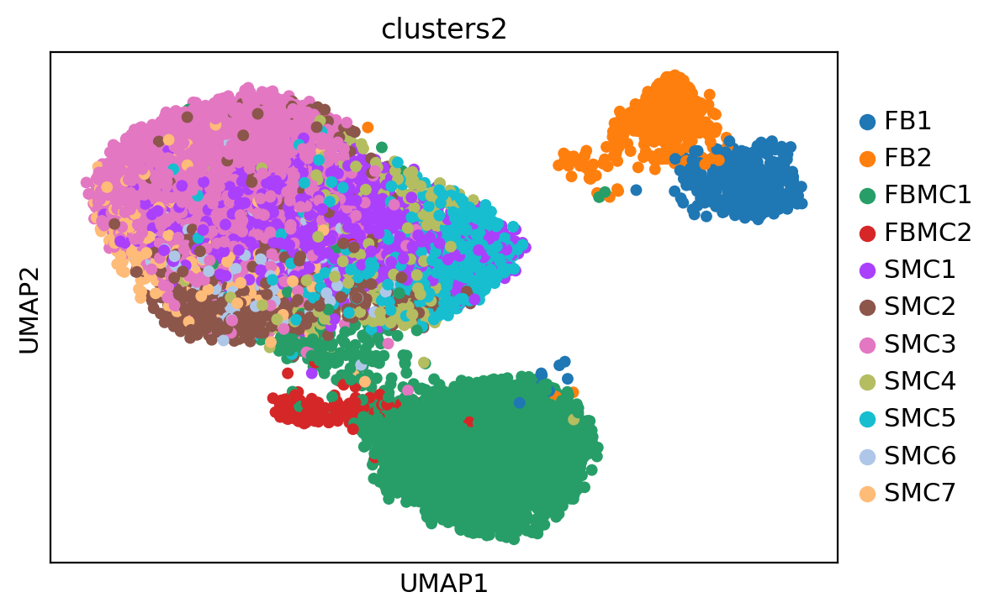

In [36]:
#scv.pp.moments(adata, n_pcs=30, n_neighbors=20)
sc.tl.umap(adata, min_dist=.8, spread=.8) # .9 min_dist is ok 
sc.pl.umap(adata, color=['clusters2'], size=100) # .8 and .8 is good

recovering dynamics (using 32/128 cores)


  0%|          | 0/522 [00:00<?, ?gene/s]

    finished (0:00:17) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:03) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:05) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:02) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


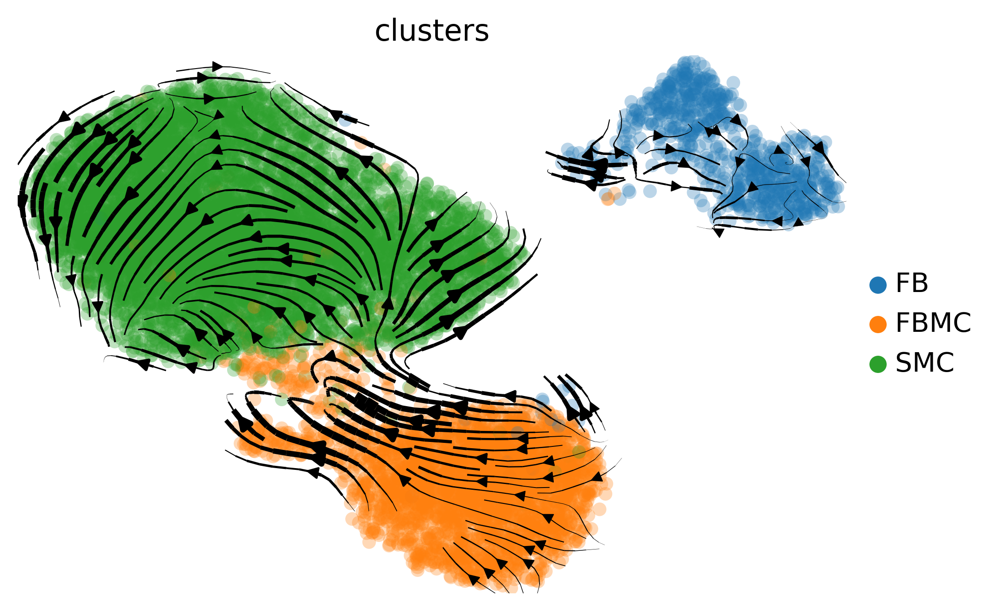

In [37]:
scv.tl.recover_dynamics(adata, n_jobs=32)
scv.tl.velocity(adata, mode='dynamical')
scv.tl.velocity_graph(adata)
scv.pl.velocity_embedding_stream(adata, basis='umap', legend_loc='right margin', dpi=200, linewidth=2, color='clusters')#, alpha=.7, size=200,frameon=True, xlim=(-2,12), ylim=(-1,12))

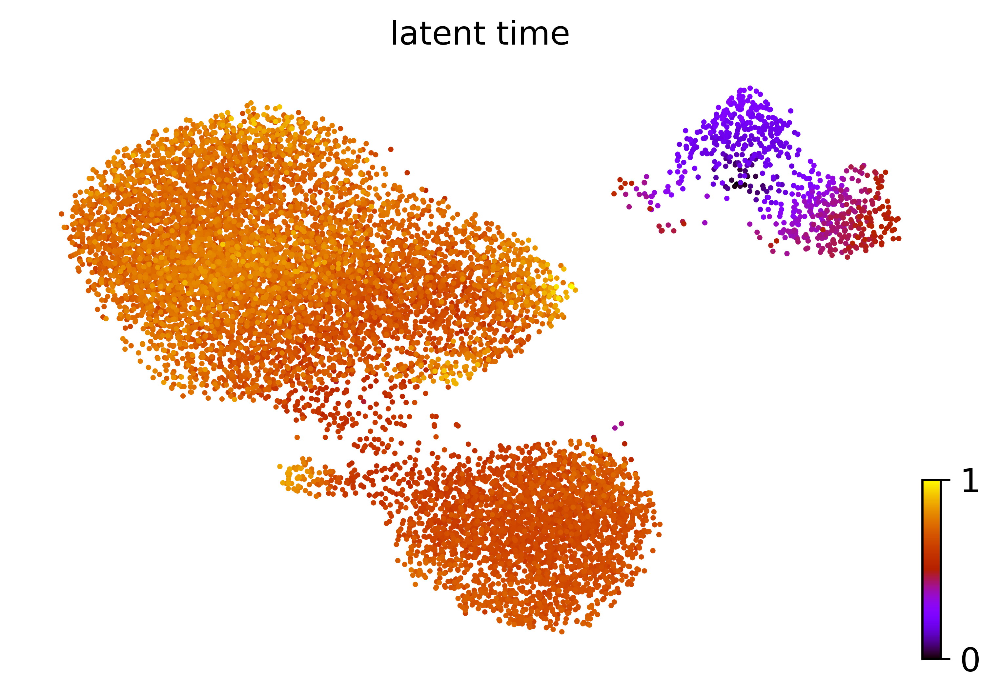

In [42]:
#scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', dpi=300)

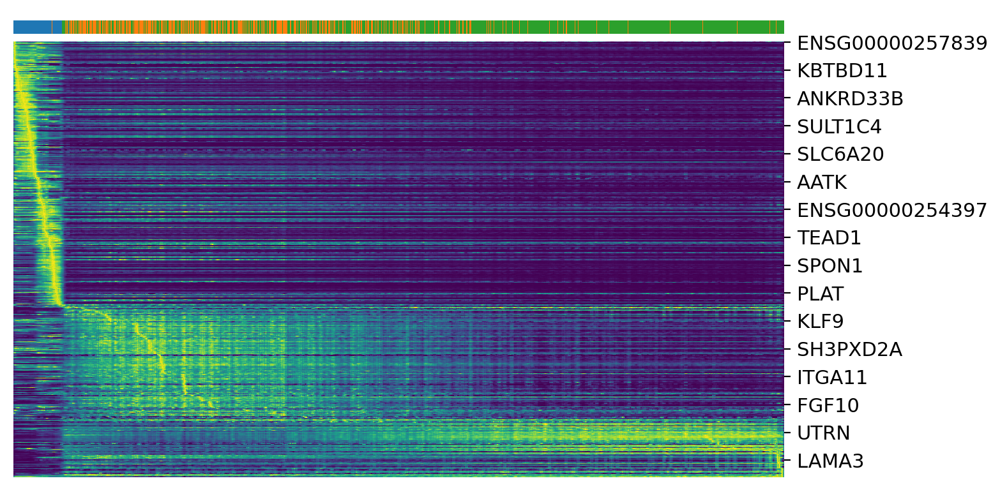

In [43]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:500]
scv.pl.heatmap(adata, var_names=top_genes, tkey='latent_time', n_convolve=50, col_color='clusters')

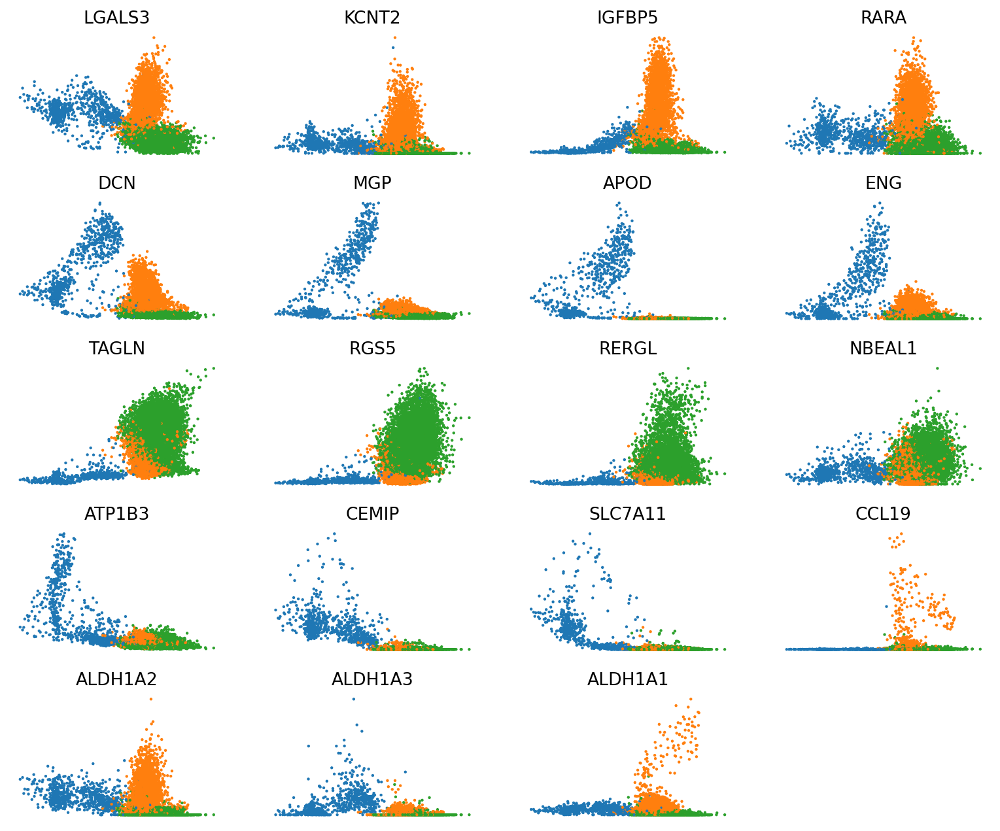

In [44]:
scv.pl.scatter(adata, x='latent_time', y=["LGALS3",'KCNT2',"IGFBP5","RARA","DCN","MGP",'APOD','ENG',"TAGLN","RGS5","RERGL","NBEAL1","ATP1B3",'CEMIP','SLC7A11','CCL19','ALDH1A2','ALDH1A3','ALDH1A1'],color='clusters',frameon=False, nrows=6)

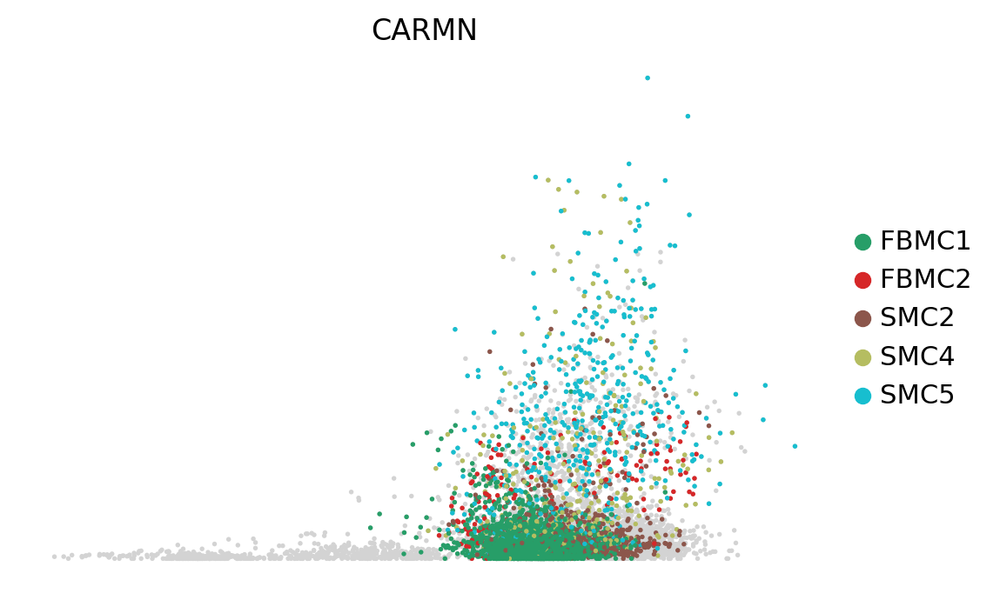

In [372]:
scv.pl.scatter(adata, x='latent_time', y=["CARMN"],color='clusters2',frameon=False,legend_loc ='right margin', groups=['FBMC1',"FBMC2","SMC2","SMC4",'SMC5'])#, nrows=6)

In [38]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:50]
scv.tl.differential_kinetic_test(adata, var_names=top_genes, groupby='clusters')

testing for differential kinetics
    finished (0:00:11) --> added 
    'fit_diff_kinetics', clusters displaying differential kinetics (adata.var)
    'fit_pval_kinetics', p-values of differential kinetics (adata.var)


In [39]:
scv.tl.velocity(adata, diff_kinetics=True)
scv.tl.velocity_graph(adata)

computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:09) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:02) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


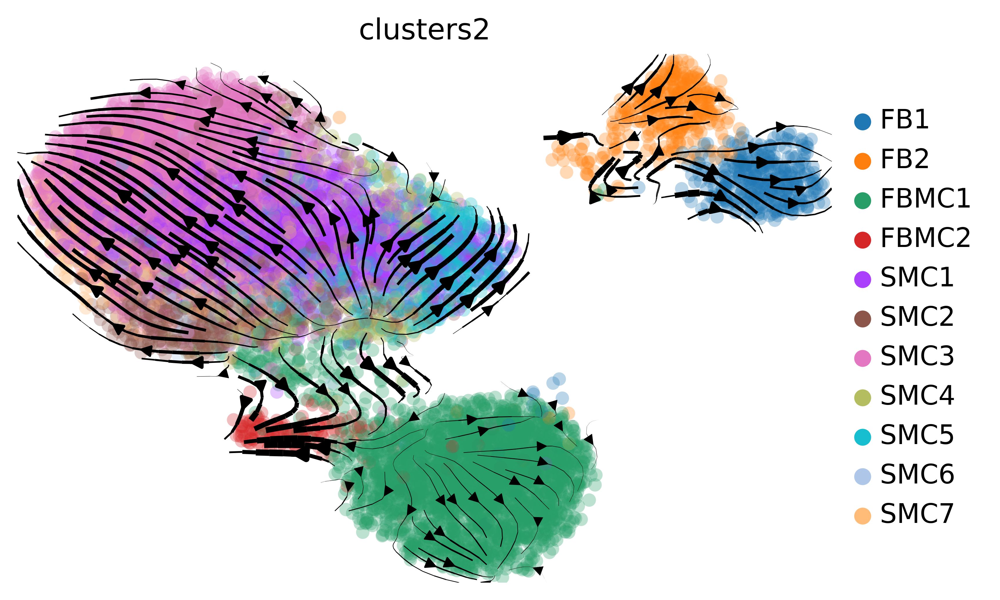

In [40]:
scv.pl.velocity_embedding_stream(adata, basis='umap', legend_loc='right margin', dpi=300, linewidth=2, color='clusters2')#, alpha=.7, size=200,frameon=True, xlim=(-2,12), ylim=(-1,12))

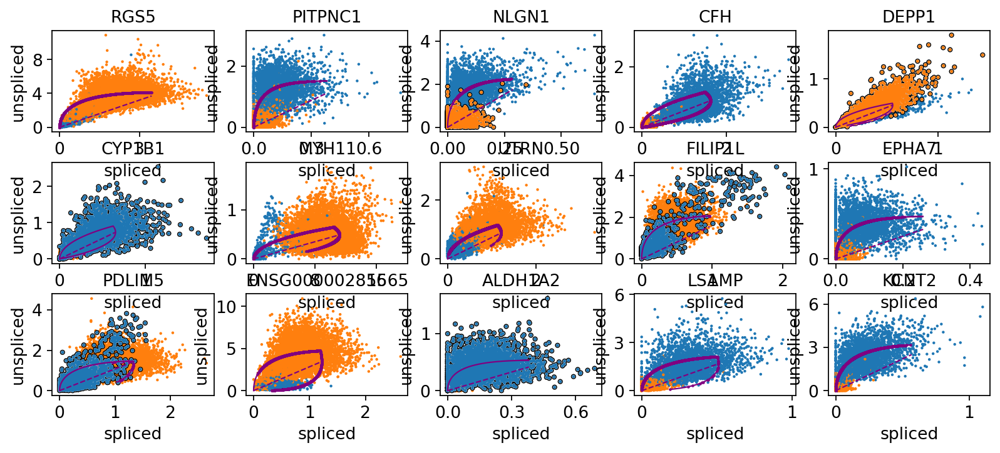

In [103]:
scv.pl.scatter(adata, basis=top_genes[:15], ncols=5, add_outline='fit_diff_kinetics')

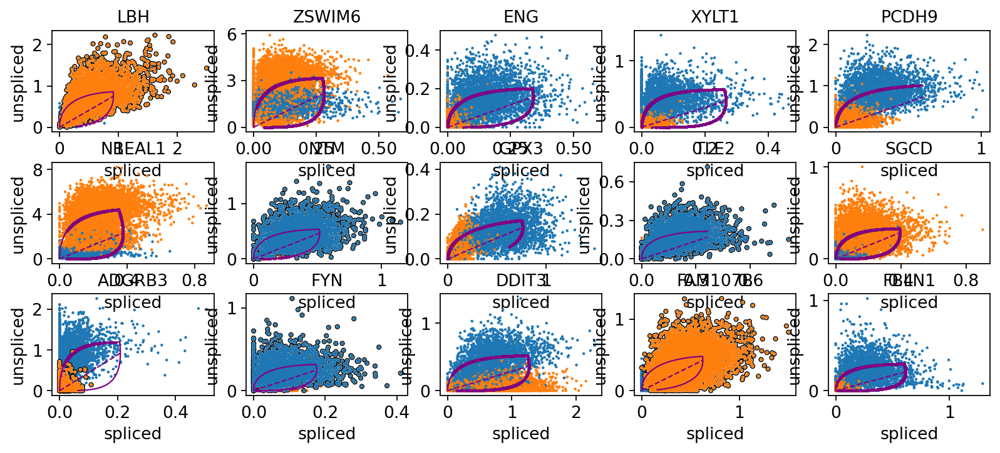

In [104]:
scv.pl.scatter(adata, basis=top_genes[15:30], ncols=5, add_outline='fit_diff_kinetics')